In [1]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

data = pd.read_excel('Past data.xlsx')
data.head()

,Date,Avail Rms,OOO Rms,Rms Sold,Rms To Sell,Occ,Arr Rms,Arrivals (Non-Guaranteed),Arr Res,SO Rms,...,Trans Rm Rev,Trans ADR,Grp Pkup Rms,Grp Rm Rev,Grp ADR,Grp Rem,Room Revenue,ADR,RevPAR,Guests
0,02/26/2023 Sun,150,57,79,14,52.666667,69,2,68,10,...,8247.52,104.398987,0,0,0.00000,0,8247.52,104.398987,54.983467,129 / 4
1,02/27/2023 Mon,150,12,105,33,70.000000,83,24,83,22,...,10166.15,123.977439,23,3197,139.00000,0,13363.15,127.268095,89.087667,136 / 1
2,02/28/2023 Tue,150,2,147,1,98.000000,94,1,93,53,...,21251.83,170.014640,22,4378,199.00000,0,25629.83,174.352585,170.865533,208 / 4
3,03/01/2023 Wed,150,31,69,50,46.000000,48,6,48,21,...,7050.23,108.465077,4,625,156.25000,0,7675.23,111.235217,51.168200,95 / 0
4,03/02/2023 Thu,150,5,125,20,83.333333,90,30,89,35,...,17837.17,191.797527,32,4299,134.34375,0,22136.17,177.089360,147.574467,172 / 3


Clean datasets

In [2]:
def splitdate(x):
    spli = x.split(" ")
    return spli[0]
data['Date'] = data['Date'].apply(splitdate)
# data.set_index('Date',inplace=True)
data.head()

,Date,Avail Rms,OOO Rms,Rms Sold,Rms To Sell,Occ,Arr Rms,Arrivals (Non-Guaranteed),Arr Res,SO Rms,...,Trans Rm Rev,Trans ADR,Grp Pkup Rms,Grp Rm Rev,Grp ADR,Grp Rem,Room Revenue,ADR,RevPAR,Guests
0,02/26/2023,150,57,79,14,52.666667,69,2,68,10,...,8247.52,104.398987,0,0,0.00000,0,8247.52,104.398987,54.983467,129 / 4
1,02/27/2023,150,12,105,33,70.000000,83,24,83,22,...,10166.15,123.977439,23,3197,139.00000,0,13363.15,127.268095,89.087667,136 / 1
2,02/28/2023,150,2,147,1,98.000000,94,1,93,53,...,21251.83,170.014640,22,4378,199.00000,0,25629.83,174.352585,170.865533,208 / 4
3,03/01/2023,150,31,69,50,46.000000,48,6,48,21,...,7050.23,108.465077,4,625,156.25000,0,7675.23,111.235217,51.168200,95 / 0
4,03/02/2023,150,5,125,20,83.333333,90,30,89,35,...,17837.17,191.797527,32,4299,134.34375,0,22136.17,177.089360,147.574467,172 / 3


In [ ]:
data['Room Revenue']

Pick out columns

In [3]:
import datetime
yvar = 'Rms Sold'
datacol = data[['Date',yvar]]
data['Date'] = pd.to_datetime(data['Date'])
datacol.set_index('Date',inplace=True)

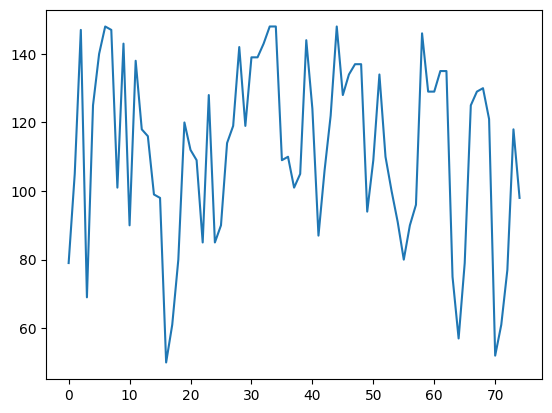

In [4]:
import matplotlib.pyplot as plt
x = data.index
y = data[yvar]
plt.plot(x,y)

Check if stationary

In [5]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

# Load the data into a pandas DataFrame object
# data = pd.read_csv('time_series_data.csv', index_col=0, parse_dates=True)

# Perform the Augmented Dickey-Fuller (ADF) test
result = sm.tsa.stattools.adfuller(datacol)

# Print the test statistic and p-value
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

# Interpret the results
if result[1] > 0.05:
    print('The data is likely non-stationary.')
else:
    print('The data is likely stationary.')

ADF Statistic: -4.609280
p-value: 0.000124
The data is likely stationary.


# ARIMAX

Build Model and print summary

In [6]:
model = sm.tsa.ARIMA(datacol,order=(1,1,1))
results = model.fit()
print(results.summary())

                               SARIMAX Results                                
Dep. Variable:               Rms Sold   No. Observations:                   75
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -341.868
Date:                Sat, 13 May 2023   AIC                            689.736
Time:                        13:58:02   BIC                            696.648
Sample:                    02-26-2023   HQIC                           692.493
                         - 05-11-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4340      0.127      3.407      0.001       0.184       0.684
ma.L1         -0.9987      1.940     -0.515      0.607      -4.800       2.803
sigma2       576.3949   1103.790      0.522      0.6

c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Forecast next 10 days

In [7]:
forecast = results.forecast(steps=10)
print(forecast)

2023-05-12    105.549768
2023-05-13    108.826504
2023-05-14    110.248667
2023-05-15    110.865912
2023-05-16    111.133807
2023-05-17    111.250079
2023-05-18    111.300543
2023-05-19    111.322445
2023-05-20    111.331951
2023-05-21    111.336077
Freq: D, Name: predicted_mean, dtype: float64


# Using SARIMAX and rooms sold

In [9]:
yvar = 'Rms Sold'
datacol = data[['Date',yvar]]
data['Date'] = pd.to_datetime(data['Date'])
datacol.set_index('Date',inplace=True)

# Perform the Augmented Dickey-Fuller (ADF) test
result = sm.tsa.stattools.adfuller(datacol)

# Print the test statistic and p-value
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

# Interpret the results
if result[1] > 0.05:
    print('The data is likely non-stationary.')
else:
    print('The data is likely stationary.')

ADF Statistic: -4.609280
p-value: 0.000124
The data is likely stationary.


In [17]:
order = (1,1,1)
seasonal = (1,1,1,7)
model = sm.tsa.statespace.SARIMAX(datacol,order=order,seasonal_order=seasonal)
results = model.fit()

c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


In [18]:
forecast = results.forecast(steps=10)
print(forecast)

2023-05-12    108.331414
2023-05-13    106.496768
2023-05-14     67.416477
2023-05-15     68.161399
2023-05-16     93.344137
2023-05-17    113.080969
2023-05-18    109.684407
2023-05-19    113.291445
2023-05-20    107.770870
2023-05-21     62.812145
Freq: D, Name: predicted_mean, dtype: float64


## hyperparameter tuning

In [10]:
import itertools

p=d=q=range(0,5)
pdq = list(itertools.product(p,d,q))
seasonal_pdq = [(x[0],x[1],x[2],7) for x in pdq]

def evalSARIMA(data,order,seasonal_order):
    model = sm.tsa.statespace.SARIMAX(data,order=order,seasonal_order=seasonal_order)
    model_fit = model.fit()
    return model_fit.aic

best_score, best_params, best_seasonal_params = float("inf"), None, None
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            aic = evalSARIMA(datacol, param, param_seasonal)
            # Update the best score and parameters if a better model is found
            if aic < best_score:
                best_score, best_params, best_seasonal_params = aic, param, param_seasonal
        except:
            continue


print('Best Model: SARIMA({}, {}, {})x({}, {}, {}, {}) - AIC: {:.2f}'.format(
    best_params[0], best_params[1], best_params[2],
    best_seasonal_params[0], best_seasonal_params[1], best_seasonal_params[2], best_seasonal_params[3],
    best_score))

c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\GakuTokusumi\AppData\Lo

Best Model: SARIMA(0, 1, 1)x(2, 4, 0, 7) - AIC: 8.00


Did not return great values. could be due to limimted data

In [6]:
order = (1,0,0)
seasonal = (1,0,0,7)
model = sm.tsa.statespace.SARIMAX(datacol,order=order,seasonal_order=seasonal)
results = model.fit()

c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\GakuTokusumi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


In [7]:
forecast = results.forecast(steps=10)
print(forecast)

2023-05-12    94.630047
2023-05-13    88.713127
2023-05-14    66.436735
2023-05-15    65.877300
2023-05-16    67.427710
2023-05-17    76.045591
2023-05-18    67.985068
2023-05-19    64.662903
2023-05-20    60.777546
2023-05-21    52.508565
Freq: D, Name: predicted_mean, dtype: float64


In [5]:
from pmdarima import auto_arima

auto_arima(datacol['Rms Sold'],seasonal=True,
           m=7,max_p=7,max_d=5,max_q=7, max_P=4, max_D=4,max_Q=4).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                                 y   No. Observations:                   75
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 7)   Log Likelihood                -343.291
Date:                           Wed, 17 May 2023   AIC                            694.582
Time:                                   10:08:13   BIC                            703.852
Sample:                               02-26-2023   HQIC                           698.283
                                    - 05-11-2023                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     51.9505     13.682      3.797      0.000      25.134      78.767
ar.L1          0.4236      0.115      3.676      0.000       0.198       0.649
ar.S.L7        0.1873      0.105      1.783      0.075      -0.019       0.393
sigma2       550.3481    108.890      5.054      0.000     336.929     763.768
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 3.18
Prob(Q):                              0.94   Prob(JB):                         0.20
Heteroskedasticity (H):               0.64   Skew:                            -0.48
Prob(H) (two-sided):                  0.27   Kurtosis:                         2.71
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import datetime

# Load the data into a pandas DataFrame object
data = datacol
# data.index = data.index.apply(datetime.datetime)
# Decompose the data into its components
# decomposition = sm.tsa.seasonal_decompose(data.index[0], model='additive')

# # Plot the decomposed data
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10, 8))
# decomposition.observed.plot(ax=ax[0], legend=False)
# ax[0].set_ylabel('Observed')
# decomposition.trend.plot(ax=ax[1], legend=False)
# ax[1].set_ylabel('Trend')
# decomposition.seasonal.plot(ax=ax[2], legend=False)
# ax[2].set_ylabel('Seasonal')
# decomposition.resid.plot(ax=ax[3], legend=False)
# ax[3].set_ylabel('Residual')
# plt.tight_layout()

# # Detrend the data by subtracting the trend component
# detrended_data = data - decomposition.trend

# Test for stationarity using the Augmented Dickey-Fuller (ADF) test
result = sm.tsa.stattools.adfuller(data)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
